# Introduction

### Configuration

In [1]:
from pathlib import Path

# The cache directories:
cache_path       = '/data/crcns2021/hcpannot-cache'
image_cache_path = f'{cache_path}/annot-images'
v123_cache_path  = f'{cache_path}/annot-v123'
csulc_cache_path = f'{cache_path}/annot-csulc'
results_path = '/data/crcns2021/results'
contour_save_path = f'{results_path}/data_branch/save'
proc_path = f'{results_path}/proc'
traces_path = f'{proc_path}/traces'
paths_path = f'{proc_path}/paths'
labels_path = f'{proc_path}/labels'

hcpannot_lib_path = Path('~/hcp-annot-vc')
#If you aren't using /data
import os
os.environ['HCPANNOT_LOAD_PATH'] = cache_path

### Dependencies

In [2]:
import sys, pimms, pandas, warnings, urllib, datetime
import numpy as np
import pandas as pd
import scipy as sp
import scipy.sparse as sps
import nibabel as nib
import neuropythy as ny

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import ipyvolume as ipv
import torch, json

from collections import defaultdict

In [3]:
%matplotlib inline

In [4]:
# Additional matplotlib preferences:
font_data = {'family':'sans-serif',
             'sans-serif':['HelveticaNeue', 'Helvetica', 'Arial'],
             'size': 10,
             'weight': 'light'}
mpl.rc('font',**font_data)
# we want relatively high-res images, especially when saving to disk.
mpl.rcParams['figure.dpi'] = 72*2
mpl.rcParams['savefig.dpi'] = 72*4

### Import `hcpannot`

In [5]:
# Make sure we are in the right directory for this!
hcpannot_lib_path = Path('~/hcp-annot-vc')

if hcpannot_lib_path:
    hlp = os.path.expandvars(os.fspath(hcpannot_lib_path))
    hlp = os.path.expanduser(hlp)
    if hlp.strip('/').endswith('hcpannot'):
        warnings.warn(
            "adding hcpannot_lib_path that ends with 'hcpannot';"
            " the hcpannot_lib_path should contain the hcpannot directory")
    if os.path.isdir(hlp):
        sys.path.append(hlp)
    else:
        raise ValueError("hcpannot_lib_path is not a directory")
# We try importing it and if we fail, we check to see if we are just running
# the notebook from the work directory and try again.
try:
    import hcpannot
except ModuleNotFoundError:
    hcpannot = None
    if os.getcwd().endswith('/work'):
        hlp = os.path.abspath('..')
        sys.path.append(hlp)

# Note the cache path we want to use outside the docker container;
# normally this gets set by the Docker startup, so here outside
# the docker container we set it manually.
hcpannot.interface.default_load_path = cache_path
# We have to update some data after setting this.

# We also want to grab a few variables from hcpannot:
from hcpannot.interface import default_imshape as roi_image_shape
roi_image_shape = roi_image_shape[0] // 2
from hcpannot.interface import imgrid_to_flatmap
from hcpannot.interface import flatmap_to_imgrid
# The proc (for processing contours):
from hcpannot.proc import (proc, rigid_align_points)
# The functions for loading and saving contours.
from hcpannot import (save_contours, load_contours)

# Subject lists. These are defined in the analysis subpackage of
# the hcpannot library, and subject_list_<x> is the <x>th list of
# subject IDs that we assigned.

### POTENTIAL ISSUE WITH
from hcpannot import subject_list
sids = np.array(hcpannot.subject_list)

# The mean rater's name ('mean') and some plotting functions are also defined in
# the hcpannot.analysis subpackage.
from hcpannot.config import meanrater #plot_vc_contours)

#Finally, we have some multiprocessing tools.
# from hcpannot.mp import (tupcall, okaystr, failstr, retry_sleep, mprun, mpstep,
#                          makejobs)

from hcpannot.analysis.contour import *

### Usage Notes

Here's an example code-block using the `plot_contours` function to plot a set of boundaries along with the V1-V3 contours.

```python
dat = proc('ventral', rater='BrendaQiu',
              sid=111312,
              hemisphere='lh',
              save_path=proc_path,
              load_path=contour_save_path)
# Make the flatmap plot and the boundaries.
fig = plot_contours(dat, boundaries=True)
# Extract the pyplot axes that were used.
ax = fig.axes[0]
# Grab the subject data, which includes the V1-V3 contours.
sdat = hcpannot.interface.subject_data[(dat['sid'],dat['hemisphere'])]
# And plot all of these contours:
for (x,y) in sdat['v123'].values():
    ax.plot(x, y, 'w-', lw=0.25)
```

## Work

#### Break contours into 500 evenly spaced points

In [6]:
# define contours of interest
contours = ['hV4_outer','hV4_VO1','VO1_VO2','VO_outer', 'V3v']

# define the number of points to sample along each contour
npoints = 500

```python
# generate all contour coordinates
# iterate over all subjects
for subject_id in sids: 
    for contour in contours:
        for r in raters:
            for hemi in ['lh', 'rh']:
                
                # define the cache file
                cache_file = os.path.join(proc_path, 'fsaverage',  f"cacherater_{r}_{subject_id}_{hemi}_{contour}.mgz")

                try:
                    # find the contour coordinates
                    coords = gen_contour_coords(r, subject_id, hemi, contour, proc_path, contour_save_path, npoints)
                    
                    # save the coordinates
                    ny.save(cache_file, coords)

                except Exception as e:
                    print(e)
                    continue
                
    print(f'Finished processing {subject_id}')
```

#### Example: Plot all raters' contours of subject 973770

/home/brendaqiu/.conda/envs/cnn/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
/home/brendaqiu/.conda/envs/cnn/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


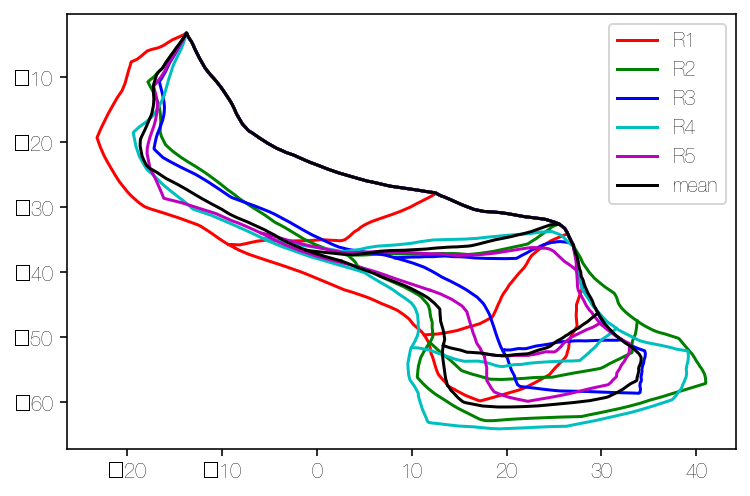

In [7]:
plot_contours(raters=raters, subject_id=973770, hemi='lh', contours=contours, proc_path=proc_path, 
              contour_save_path=contour_save_path, npoints=npoints)

#### Check if any cache file is missing

In [8]:
mis_rater = []
mis_sid = []
mis_hemi = []
mis_contour = []
mis_type = []

# iterate over all subjects, raters, hemispheres, and contours
# and check if the contour coordinates have been saved
for sid in sids:
    for r in raters:
        for roi in contours:
            for hemi in ['lh', 'rh']:
                # check if the cache file exists
                missing_types = [t for t in ['fsaverage', 'fsnative', 'fsnative_aligned'] 
                                 if not os.path.exists(os.path.join(proc_path, t, f"cacherater_{r}_{sid}_{hemi}_{roi}.mgz"))]
                
                # if the cache file does not exist, add the missing information to the list
                if missing_types:
                    mis_rater.extend([r] * len(missing_types))
                    mis_sid.extend([sid] * len(missing_types))
                    mis_hemi.extend([hemi] * len(missing_types))
                    mis_contour.extend([roi] * len(missing_types))
                    mis_type.extend(missing_types)

# create a dataframe of missing information
miss_df = pd.DataFrame({
    'sid': mis_sid,
    'rater': mis_rater,
    'hemi': mis_hemi,
    'contour': mis_contour,
    'type': mis_type
})

miss_df

,sid,rater,hemi,contour,type
0,100610,R1,lh,hV4_outer,fsaverage
1,100610,R1,lh,hV4_outer,fsnative
2,100610,R1,lh,hV4_outer,fsnative_aligned
3,100610,R1,rh,hV4_outer,fsaverage
4,100610,R1,rh,hV4_outer,fsnative
...,...,...,...,...,...
30728,995174,mean,rh,VO_outer,fsnative_aligned
30729,995174,mean,lh,V3v,fsnative
30730,995174,mean,lh,V3v,fsnative_aligned
30731,995174,mean,rh,V3v,fsnative


In [9]:
miss_df = pd.DataFrame({
    'sid': mis_sid,
    'rater': mis_rater,
    'hemi': mis_hemi,
    'contour': mis_contour,
    'type': mis_type
})

miss_df

,sid,rater,hemi,contour,type
0,100610,R1,lh,hV4_outer,fsaverage
1,100610,R1,lh,hV4_outer,fsnative
2,100610,R1,lh,hV4_outer,fsnative_aligned
3,100610,R1,rh,hV4_outer,fsaverage
4,100610,R1,rh,hV4_outer,fsnative
...,...,...,...,...,...
30728,995174,mean,rh,VO_outer,fsnative_aligned
30729,995174,mean,lh,V3v,fsnative
30730,995174,mean,lh,V3v,fsnative_aligned
30731,995174,mean,rh,V3v,fsnative


#### Plot mean contour of each subject

/tmp/ipykernel_19538/2456683913.py:13: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.savefig('contours.pdf', bbox_inches = 'tight')
/tmp/ipykernel_19538/2456683913.py:13: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.savefig('contours.pdf', bbox_inches = 'tight')
/home/brendaqiu/.conda/envs/cnn/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


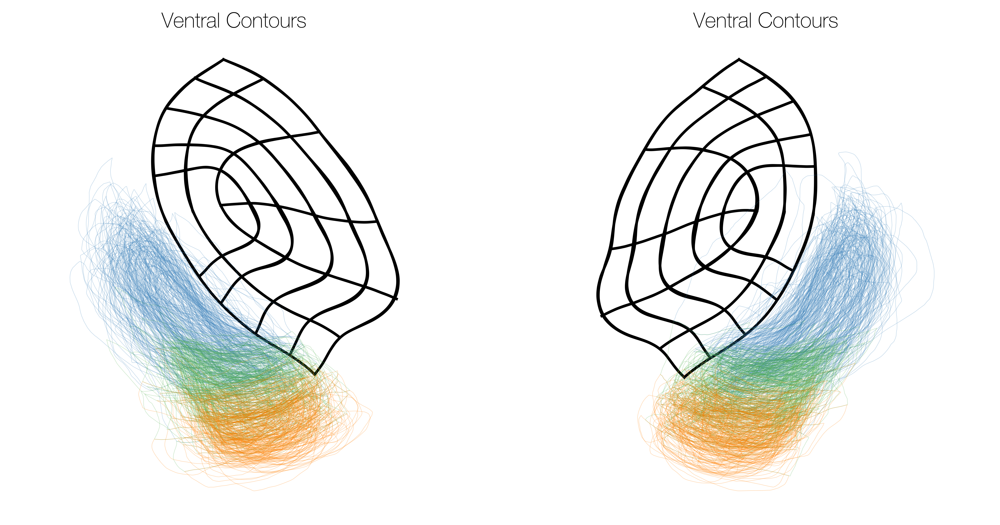

In [10]:
roi_colors = {'hV4': '#377eb8',
              'VO1': '#4daf4a',
              'VO2': '#ff7f00'}

# load the mean V1, V2, and V3 contours
meanlines = ny.load('/data/crcns2021/hcpannot-cache/annot-v123/999999.json.gz')

# define the ROIs to plot
rois = ['hV4', 'VO1', 'VO2']
fig, axes = plt.subplots (1,2, figsize=(10,5), dpi=1200)

# plot the contours for the left and right hemispheres
for i, hemi in enumerate(['lh', 'rh']):
    plot_lc(sids, hemi, rois, space='fsaverage', plot_v123=True, meanlines=meanlines,
            proc_path=proc_path, ax=axes[i], colors=roi_colors)

#plt.savefig('contours.pdf', bbox_inches = 'tight')

### Align fsnative contours

In [ ]:
for hemi in ['lh', 'rh']:
    for sid in sids: 
        for r in raters:
            align_fsnative(sid, hemi, contours, r, proc_path)

#### Inpsect aligned fsnatvie contours

In [ ]:
subject_ids = np.random.choice(sids, size=2)
plt.axis('equal')
colors = ['g','r','b']
hemi = 'lh'
contour = 'hV4_outer'
for i, subject_id in enumerate(subject_ids):
    
    mean_cache_file = os.path.join(proc_path, 'fsaverage', f"cacherater_mean_{subject_id}_{hemi}_{contour}.mgz")
    coords = ny.load (mean_cache_file)
    plt.plot(coords[0], coords[1], 'k-')

    for r in raters:
        cache_file_aligned = os.path.join(proc_path, 'fsnative_aligned', f'cacherater_{r}_{subject_id}_{hemi}_{contour}.mgz')
        coords = ny.load(cache_file_aligned)
        plt.plot(coords[0], coords[1], c = colors[i])
        
        cache_file_aligned = os.path.join(proc_path, 'fsnative', f'cacherater_{r}_{subject_id}_{hemi}_{contour}.mgz')
        coords = ny.load(cache_file_aligned)
        plt.plot(coords[0], coords[1], c = colors[i], alpha=0.3)

### Variability of contours

In [ ]:
def contour_std(hemi, npoints=500, subject_rm=None):
    
    all_contours = defaultdict(lambda:[])
    result = {}
    
    for i, subject_id in enumerate(sids):
        if i == subject_rm:
            print(subject_id)
            continue
        else:
            for name in sub_contours:
                try:
                    file = os.path.join(proc_path, 'fsaverage', f"cacherater_mean_{subject_id}_{hemi}_{name}.mgz")
                    coords = ny.load(file)
                    all_contours[name].append(coords)
                except Exception as e:
                    print(e)


    for name in sub_contours:
        contour_mean = np.mean(all_contours[name], axis=0) #use proc() instead
        contour_dist = np.sqrt(np.sum((all_contours[name]-contour_mean)**2, axis=1))
        result[name] = np.std(contour_dist, axis=0)

    return (all_contours, result)
    

In [ ]:
(all_contours_lh, sd_lh) = contour_std('lh')
(all_contours_rh, sd_rh) = contour_std('rh')

(all_contours_lh_rm, sd_lh_rm) = contour_std('lh', subject_rm=178)
(all_contours_rh_rm, sd_rh_rm) = contour_std('rh', subject_rm=178)

In [ ]:
(fig,ax) = plt.subplots(2, 2, figsize=(8,8), dpi=72*8, sharey=True, sharex=True)


for c in sub_contours:
    ax[0,0].plot(range(500), sd_lh[c], '-', label=f'{c}')
    ax[0,1].plot(range(500), sd_rh[c], '-', label=f'{c}')
    ax[1,0].plot(range(500), sd_lh_rm[c], '-', label=f'{c}')
    ax[1,1].plot(range(500), sd_rh_rm[c], '-', label=f'{c}')
    
    
ax[0,0].set_title('lh')
ax[0,1].set_title('rh')
ax[0,0].set_ylabel('SD of distance to the mean coordinate')
ax[1,0].set_ylabel('SD of distance to the mean coordinate after removing 706040')
fig.supxlabel('Coordinates along the contour')
ax[0,1].legend()
ax[1,1].legend()

In [ ]:
def lwplot(x, y, axes=None, fill=True, edgecolor=None, color=None, **kw):
    '''
    lwplot(x, y) is equivalent to pyplot.plot(x, y), however the linewidth or lw options
      are interpreted in terms of the the coordinate system instead of printer points.
    lwplot(x, y, ax) plots on the given axes ax.
    
    All optional arguments that can be passed to pyplot's Polygon can be passed to lwplot.
    '''
    from neuropythy.util import zinv
    lw = kw['linewidth'] if 'linewidth' in kw else kw['lw'] if 'lw' in kw else None
    if 'linewidth' in kw: lw = kw.pop('linewidth')
    elif 'lw' in kw: lw = kw.pop('lw')
    else: lw = 0
    axes = plt.gca() if axes is None else axes
    if len(x) < 2: raise ValueError('lwplot line must be at least 2 points long')
    # we plot a particular thickness; we need to know the orthogonals at each point...
    pts = np.transpose([x,y])
    dd  = np.vstack([[pts[1] - pts[0]], pts[2:] - pts[:-2], [pts[-1] - pts[-2]]])
    nrm = np.sqrt(np.sum(dd**2, 1))
    dd  *= np.reshape(zinv(nrm), (-1,1))
    dd  = np.transpose([dd[:,1], -dd[:,0]])
    # we make a polygon or a trimesh...
    if pimms.is_vector(lw): lw = np.reshape(lw, (-1,1))
    xy = np.vstack([pts + lw*dd, np.flipud(pts - lw*dd)])
    n = len(pts)
    if pimms.is_vector(color) and len(color) == n:
        clr = np.concatenate([color, np.flip(color)])
        (nf0,nf1) = (np.arange(n-1), np.arange(1,n))
        (nb0,nb1) = (2*n - nf0 - 1,  2*n - nf1 - 1)
        tris = np.hstack([(nf0, nf1, nb0), (nb0, nb1, nf1)]).T
        (x,y) = xy.T
        tri = mpl.tri.Triangulation(x, y, tris)
        if 'cmap' not in kw: kw['cmap'] = 'hot'
        return axes.tripcolor(tri, clr, shading='gouraud',
                              linewidth=0, **kw)
    else:
        pg  = plt.Polygon(xy, closed=True, fill=fill, edgecolor=edgecolor,
                          linestyle=None, linewidth=0, color=color, **kw)
        return axes.add_patch(pg)

In [ ]:
fig, ax = plt.subplots(1,1)
lwplot([0.0,1.0,2.0], [0.0,1,0], axes=ax, cmap='hot', color=[.1,.2,.3], lw=[.1,.2,.3])
ax.axis('equal')

In [ ]:
def plot_errorbar(contours, sd, ax, scale=True):
    
    ax.axis('equal')
    mean_contours = np.mean(contours, axis=0)
    x_coords = mean_contours[0]
    y_coords = mean_contours[1]
    ax.plot(x_coords, y_coords, 'k-', alpha = 0.5)
    
#     if scale==True:
#         scalar = 6/7
#     else:
#         scalar = 1
        
#     for i in range(np.shape(x_coords)[0]):
        
#         sd_coord = sd[i]
        
#         x_curve = np.array([x_coords[i] - sd_coord*scalar, x_coords[i] + sd_coord*scalar])
#         y_curve1 = np.array([y_coords[i] - sd_coord*scalar, y_coords[i] - sd_coord*scalar])
#         y_curve2 = np.array([y_coords[i] + sd_coord*scalar, y_coords[i] + sd_coord*scalar])
        
#         if i == 250 and contour == 'V3v':
#             ax.fill_between(x_curve, y_curve1, y_curve2, color = 'red', alpha=1)       
#         else:
#             ax.fill_between(x_curve, y_curve1, y_curve2, color = colors[contour], alpha=0.05)
        
#         ax.set_aspect('equal', adjustable='box')
    
    sd = np.asarray(sd) - 2.5
    hmap = lwplot(x_coords, y_coords, axes=ax, cmap='hot', vmin=0.5, vmax=1.7, color=sd, lw=sd)
    
    return hmap


In [ ]:
(fig,ax) = plt.subplots(2, 2, figsize = (8,8), dpi = 72*8)
for contour in all_contours_lh.keys():
    hmap = plot_errorbar(all_contours_lh[contour], sd_lh[contour], ax = ax[0,0])
    hmap = plot_errorbar(all_contours_rh[contour], sd_rh[contour], ax = ax[0,1])

#subject 706040
ax[0,0].plot(all_contours_lh['V3v'][178][0], all_contours_lh['V3v'][178][1], label='706040')    
ax[0,1].plot(all_contours_rh['V3v'][178][0], all_contours_rh['V3v'][178][1], label='706040')  
ax[0,0].legend()
ax[0,1].legend()

for contour in all_contours_lh.keys():
    hmap = plot_errorbar(all_contours_lh_rm[contour], sd_lh_rm[contour], ax = ax[1,0])
    hmap = plot_errorbar(all_contours_rh_rm[contour], sd_rh_rm[contour], ax = ax[1,1])

#subject 706040
ax[1,0].plot(all_contours_lh['V3v'][178][0], all_contours_lh['V3v'][178][1], label='706040')    
ax[1,1].plot(all_contours_rh['V3v'][178][0], all_contours_rh['V3v'][178][1], label='706040')  
ax[1,0].legend()
ax[1,1].legend()

fig.colorbar(hmap)

### Probability Maps

In [ ]:
region = 'ventral'

region_raters = {
    'ventral': raters}

allprocs = {
    (r,s,h): ny.util.curry(
       lambda r,s,h: proc(
           'ventral',
           rater=r, sid=s, hemisphere=h,
           load_path=contour_save_path, save_path=proc_path,
           overwrite=False),
       r, s, h)
    for r in region_raters[region]
    for s in sids
    for h in ('lh','rh')}
for s in sids:
    for h in ('lh','rh'):
        allprocs['mean', s, h] = proc(
            'ventral',
            rater='mean',
            sid=s, hemisphere=h,
            load_path=contour_save_path, save_path=proc_path,
            overwrite=False)
allprocs = pimms.lazy_map(allprocs)

In [ ]:
data=proc('ventral', rater='mean', sid=999999, hemisphere='lh', load_path=contour_save_path, save_path=proc_path,)

In [ ]:
# Goal: to write a function that takes a rater and hemisphere as arguments.
# Also should work for the mean rater.

def fsaverage_label (rater, hemi, sids=sids):
    
    fsaverage_hem = ny.freesurfer_subject('fsaverage').hemis[hemi]
    fsaverage_labels = []
        
    for sid in sids:
        try:
            dat = allprocs[rater, sid, hemi]
            native_labels = dat['labels']
            cortex = dat['cortex']
            fsa_lbl = cortex.interpolate(fsaverage_hem, native_labels, method='nearest')
            fsaverage_labels.append(fsa_lbl)
        except Exception as e:
            print(e)
            print(sid, hemi, rater)
        
    fsaverage_labels = np.array(fsaverage_labels)
    probability_maps = {}
    
    for area_label in np.unique(fsaverage_labels):
        if area_label == 0:
            continue
        probability_maps[area_label] = np.sum(fsaverage_labels == area_label, axis=0) / fsaverage_labels.shape[0]

    return probability_maps

In [ ]:
# error with nourah and jennifer's native_labels
# dat = allprocs['jennifertepan', 172130, 'lh']
# native_labels = dat['labels']

In [ ]:
# rater = 'jennifertepan'
# hemi = 'lh'
# probability_maps = fsaverage_label(rater, hemi, sids=sids)
# np.save(f'{proc_path}/probability_maps/cacheprob_{rater}_{hemi}.npy', probability_maps)

In [ ]:
raters_m = raters + ['mean']

In [ ]:
def plot_probability (raters, hemi):
    fsaverage_hem = ny.freesurfer_subject('fsaverage').hemis[hemi]
    flatmap = ny.to_flatmap('occipital_pole', fsaverage_hem, radius=np.pi/2)

    (fig, ax) = plt.subplots(3, len(raters), figsize=(14,6), dpi=72*8, sharex=True, sharey=True)

    for i, roi in enumerate(range(4,7)):
        for j, rater in enumerate(raters):
            
            try:
                probability_maps = np.load(f'{proc_path}/probability_maps/cacheprob_{rater}_{hemi}.npy', allow_pickle=True).item()
                color_label = probability_maps[roi][flatmap.labels]
                ny.cortex_plot(flatmap, color=color_label, cmap='hot', vmin=0, vmax=1, axes=ax[i,j])
                
            except Exception as e:
                print(e)

            if i == 0:   
                ax[i,j].set_title(f'{rater}')

            if j == 0:   
                ax[i,j].set_ylabel(f'{roi}')  

In [ ]:
plot_probability(raters_m, 'lh')

In [ ]:
plot_probability(raters_m, 'rh')

#### Isolines of individual rater on the mean probability map

In [ ]:
def plot_isolines(rater, 
                  rois = [4, 5, 6], 
                  isovalues = [0.1, 0.2, 0.3, 0.4, 0.5], 
                  cm='cool'):
    # plot isolines for each rater and roi, using the mean probability map as the background

    (fig, ax) = plt.subplots(2, 3, figsize=(12,8), dpi=512)
    cmap = getattr(mpl.cm, cm)

    for i, hemi in enumerate(['lh', 'rh']):
        
        dat = np.load(
            f'/data/crcns2021/results/proc/probability_maps/cacheprob_{rater}_{hemi}.npy',
            allow_pickle=True)
        dat = dat.item()
        
        meandat = np.load(
            f'/data/crcns2021/results/proc/probability_maps/cacheprob_mean_{hemi}.npy',
            allow_pickle=True)
        meandat = meandat.item()
        
        fsa = ny.freesurfer_subject('fsaverage')
        fsa_hem = fsa.hemis[hemi]
        flatmap = ny.to_flatmap('occipital_pole', fsa_hem, radius=np.pi/2)

        for j, roi in enumerate(rois):
            
            prob = dat[roi][flatmap.labels]
            meanprob = meandat[roi][flatmap.labels]

            ny.cortex_plot(flatmap, color=meanprob, cmap='hot', vmin=0, vmax=0.6, axes=ax[i,j])

            for isoval in isovalues:
                color = cmap(isoval)
                try:
                    lns = ny.isolines(flatmap, prob, isoval)
                    for (x,y) in lns:
                        ax[i,j].plot(x, y, '-', color=color, lw=0.5)
                except ValueError:
                    pass
                
        ax[0,1].set_title(rater)

In [ ]:
plot_isolines(raters[0])

In [ ]:
plot_isolines(raters[1])

In [ ]:
plot_isolines(raters[2])

In [ ]:
plot_isolines(raters[3])

In [ ]:
plot_isolines(raters[4])

#### Comparing Raters

In [ ]:
# find raters who have the largest v.s. smallest contours on average

filename = '/data/crcns2021/results/proc/ventral_sareas.tsv'
data = pd.read_csv(filename, sep='\t')

In [ ]:
# left and right hemisphere data are combined when averaging
data.groupby('rater')['hV4_percent'].mean().sort_values()

In [ ]:
np.std(data['hV4_percent'])/np.mean(data['hV4_percent'])

In [ ]:
data.groupby('rater')['VO1_percent'].mean().sort_values()

In [ ]:
np.std(data['VO1_percent'])/np.mean(data['VO1_percent'])

In [ ]:
data.groupby('rater')['VO2_percent'].mean().sort_values()

In [ ]:
np.std(data['VO2_percent'])/np.mean(data['VO2_percent'])

In [ ]:
def compare_isolines(rater1, rater2, roi,
                 cm1='cool',
                 cm2='hot',
                 isovalues = [0.1, 0.2, 0.3, 0.4, 0.5]):
    
    (fig, ax) = plt.subplots(1, 2, figsize=(8,4), dpi=512)
    
    cmap1 = getattr(mpl.cm, cm1)
    cmap2 = getattr(mpl.cm, cm2)

    for i, hemi in enumerate(['lh', 'rh']):
        
        dat1 = np.load(
            f'/data/crcns2021/results/proc/probability_maps/cacheprob_{rater1}_{hemi}.npy',
            allow_pickle=True)
        dat1 = dat1.item()
        
        dat2 = np.load(
            f'/data/crcns2021/results/proc/probability_maps/cacheprob_{rater2}_{hemi}.npy',
            allow_pickle=True)
        dat2 = dat2.item()
        
#         meandat = np.load(
#             f'/data/crcns2021/results/proc/probability_maps/cacheprob_mean_{hemi}.npy',
#             allow_pickle=True)
#         meandat = meandat.item()
        
        fsa = ny.freesurfer_subject('fsaverage')
        fsa_hem = fsa.hemis[hemi]
        flatmap = ny.to_flatmap('occipital_pole', fsa_hem, radius=np.pi/2)

        prob1 = dat1[roi][flatmap.labels]
        prob2 = dat2[roi][flatmap.labels]

#         ny.cortex_plot(flatmap, color=meanprob, cmap='hot', vmin=0, vmax=0.6, axes=ax[i,j])
        
        ny.cortex_plot(flatmap, axes=ax[i])
        for isoval in isovalues:

            color1 = cmap1(isoval)
            color2 = cmap2(isoval)
            
            try:
                lns1 = ny.isolines(flatmap, prob1, isoval)
                lns2 = ny.isolines(flatmap, prob2, isoval)
                for (x,y) in lns1:
                    ax[i].plot(x, y, '-', color=color1, lw=0.5)
                for (x,y) in lns2:
                    ax[i].plot(x, y, '-', color=color2, lw=0.5)

            except ValueError:
                pass
        
        ax[0].set_title('lh')
        ax[1].set_title('rh')

In [ ]:
compare_isolines('nourahboujaber', 'BrendaQiu', 4) #rater1: cool; rater2: hot 

In [ ]:
compare_isolines('nourahboujaber', 'lindazelinzhao', 5)

In [ ]:
compare_isolines('nourahboujaber', 'lindazelinzhao', 6)

In [ ]:
# Check specific contour
rater = 'nourahboujaber'
sid = 100610
hemi = 'rh'
colors = {'hV4': [1,0,0], 'VO1': [0,1,0], 'VO2': [0,0,1]}

data = vc_plan(
    rater=rater,
    sid=sid,
    hemisphere=hemi,
    save_path=trace_save_path)

# fig = plot_contours(data, boundaries=True)
(fig, ax) = plt.subplots(1,1, figsize=(5,3), dpi=72*8)
for (name, (x, y)) in data['boundaries'].items():
    ax.plot(x,y,'r-'
# Grab the subject data, which includes the V1-V3 contours.
sdat = hcpannot.interface.subject_data[(data['sid'], data['hemisphere'])]
# And plot all of these contours:
ax = fig.axes[0]
for (x,y) in sdat['v123'].values():
    ax.plot(x, y, 'w-', lw=0.25)

pass -->

In [ ]:
# First: Average across two subjects for the same rater.

# Get the traces for one rater and one subject.
dat1 = vc_plan(
    rater=rater1,
    sid=sid1,
    hemisphere='lh',
    save_path=trace_save_path)
dat2 = vc_plan(
    rater=rater1,
    sid=sid2,
    hemisphere='lh',
    save_path=trace_save_path)

In [ ]:
# To average across subjects for a single rater, we need to warp everything
# into the fsaverage so that subject surfaces are aligned.
# To do this we need to make path objects from the trace objects.

# Grab a trace:
trace1 = dat1['traces']['hV4']
# Get the subject's hemisphere data:
hem1 = ny.data['hcp_lines'].subjects[sid1].hemis['lh']

# Turning the trace into a path (which knows about how the trace intersects
# the triangles in the mesh, so we can warp the trace/path into fsaverage
# alignment).
path1 = trace1.to_path(hem1)
# Make an fsaverage-aligned flatmap:
fmap1 = ny.to_flatmap('occipital_pole', hem1)
# Extract x and y coordinates in fsaverage-aligned flatmap.
fsa_coords1 = fmap1.unaddress(path1.addresses)

# Do the same thing for the other trace:
trace2 = dat2['traces']['hV4']
# Get the subject's hemisphere data:
hem2 = ny.data['hcp_lines'].subjects[sid2].hemis['lh']

# Turning the trace into a path (which knows about how the trace intersects
# the triangles in the mesh, so we can warp the trace/path into fsaverage
# alignment).
path2 = trace2.to_path(hem2)
# Make an fsaverage-aligned flatmap:
fmap2 = ny.to_flatmap('occipital_pole', hem2)
# Extract x and y coordinates in fsaverage-aligned flatmap.
fsa_coords2 = fmap2.unaddress(path2.addresses)

In [ ]:
# Plot the two subjects' traces together:
(x, y) = fsa_coords1
plt.plot(x, y, 'k.-')
(x, y) = fsa_coords2
plt.plot(x, y, 'r.-')

In [ ]:
# Average the traces of the subjects together:
curve1 = ny.util.CurveSpline(fsa_coords1)
fsa_normalized_coords1 = curve1.linspace(800)
curve2 = ny.util.CurveSpline(fsa_coords2)
fsa_normalized_coords2 = curve2.linspace(800)

fsa_coords_avg = 0.5 * (fsa_normalized_coords1 + fsa_normalized_coords2)

In [ ]:
(x, y) = fsa_coords1
plt.plot(x, y, 'b.-')
(x, y) = fsa_coords2
plt.plot(x, y, 'r.-')
# Add in the average coordinate.
(x, y) = fsa_coords_avg
plt.plot(x, y, 'k.-')

In [ ]:
# Once you've calculated a set of fsaverage-aligned points, you can save it to
# disk and reload it.
ny.save(f'{sid1}_{rater1}_fsacoords.mgz', fsa_normalized_coords1)

In [ ]:
ny.load(f'{sid1}_{rater1}_fsacoords.mgz')

In [ ]:
# Extract traces for hV4 boundary and split them into 500 evenly-spaced
# points along the boundary.
trace1 = dat1['traces']['hV4'] #'hV4' here can be replaced with 'VO1' or 'VO2'
coords1 = trace1.curve.linspace(500)
trace2 = dat2['traces']['hV4']
coords2 = trace2.curve.linspace(500)

# Now we just average the two coordinate sets.
coords_avg = 0.5 * (coords1 + coords2)

# Plot the average (along with the originals in blue and red).
for (color, (x,y)) in zip(['r', 'b', 'k'], [coords1, coords2, coords_avg]):
    plt.plot(x, y, color + '-')